# DTSA-5509 Final Project Predicting Rainfall
## Author: Alan Klein
github link: https://github.com/Saganoky/DTSA-5509-Final

### Introduction
For this project I will be analyzing a dataset of rainfall data and potential features, with the goal of predicting rainfall for each day of the year.  This is a Kaggle competition dataset.  More information can be found here: https://www.kaggle.com/competitions/playground-series-s5e3/overview.

#### Problem Solved 
Rainfall prediction is critical in a number of domains such as agriculture, transportation, water resource management, and weather forecasting.  The better predictions of rainfall that can be made, the better the above usecases can plan for the rainfall.

### Setup
The code below imports all the required packages and sets up the kaggle API.  This repo uses UV to manage packages, see https://docs.astral.sh/uv/ for more information on how to use it.  Also, if you are not familiar with UV I highly recommend you check it out for package management. It fast and easy to use.  Also, from my experience it is being used more and more in industry.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score, f1_score, roc_curve, auc, confusion_matrix, classification_report, roc_auc_score, precision_recall_curve, make_scorer
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier


In [2]:
# This sets up the kaggle API.  You need to have a kaggle account and a token to be able to run this code.  
# This video gives a pretty good explanation of how to get the token: https://www.youtube.com/watch?v=gkEbaMgvLs8&t=188s
import kaggle
from kaggle.api.kaggle_api_extended import KaggleApi
api = KaggleApi()
api.authenticate()


In [ ]:
# Run these two commands to download and unzip the data sets into the data folder.
!kaggle competitions download -c playground-series-s5e3
!unzip playground-series-s5e3.zip -d data/

In [ ]:
# This downloads the original data set from which the competition data was generated and unzips it to the data folder.
!kaggle datasets download subho117/rainfall-prediction-using-machine-learning
!unzip rainfall-prediction-using-machine-learning.zip -d data/

### Exploritory Data Analysis
The first step in exploritory data analysis(eda) is reading any available information about the data.  Data is sourced from here: https://www.kaggle.com/competitions/playground-series-s5e3/data.

The first thing to note is this data is actually synthetic data based on a real dataset(https://www.kaggle.com/datasets/subho117/rainfall-prediction-using-machine-learning).  Synthetic data is becoming more common as it allows access to more interesting data without the proprietary and privacy concerns.  This data is downloaded but I decided not to use it in the analysis.

There is not alot of information on the data on the Kaggle page.  However, they do have an EDA tool built into the website.  For this analysis I won't be using it but wanted to call it out as a interesting feature.  


In [78]:
# Read in the data as dataframes
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')
real_data = pd.read_csv('data/Rainfall.csv')
sample_submission = pd.read_csv('data/sample_submission.csv')

In [5]:
# Inspect the first 5 rows of the training data
train.head()

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
0,0,1,1017.4,21.2,20.6,19.9,19.4,87.0,88.0,1.1,60.0,17.2,1
1,1,2,1019.5,16.2,16.9,15.8,15.4,95.0,91.0,0.0,50.0,21.9,1
2,2,3,1024.1,19.4,16.1,14.6,9.3,75.0,47.0,8.3,70.0,18.1,1
3,3,4,1013.4,18.1,17.8,16.9,16.8,95.0,95.0,0.0,60.0,35.6,1
4,4,5,1021.8,21.3,18.4,15.2,9.6,52.0,45.0,3.6,40.0,24.8,0


In [6]:
# Check summary statistics of the training data
train.describe()

# One thing to note is dewpoint has a negative value which I'm not sure if it is possible.  A quick google search confirms it can be. 

,id,day,pressure,maxtemp,temparature,mintemp,dewpoint,humidity,cloud,sunshine,winddirection,windspeed,rainfall
count,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000,2190.000000
mean,1094.500000,179.948402,1013.602146,26.365799,23.953059,22.170091,20.454566,82.036530,75.721918,3.744429,104.863151,21.804703,0.753425
std,632.342866,105.203592,5.655366,5.654330,5.222410,5.059120,5.288406,7.800654,18.026498,3.626327,80.002416,9.898659,0.431116
min,0.000000,1.000000,999.000000,10.400000,7.400000,4.000000,-0.300000,39.000000,2.000000,0.000000,10.000000,4.400000,0.000000
25%,547.250000,89.000000,1008.600000,21.300000,19.300000,17.700000,16.800000,77.000000,69.000000,0.400000,40.000000,14.125000,1.000000
50%,1094.500000,178.500000,1013.000000,27.800000,25.500000,23.850000,22.150000,82.000000,83.000000,2.400000,70.000000,20.500000,1.000000
75%,1641.750000,270.000000,1017.775000,31.200000,28.400000,26.400000,25.000000,88.000000,88.000000,6.800000,200.000000,27.900000,1.000000
max,2189.000000,365.000000,1034.600000,36.000000,31.500000,29.800000,26.700000,98.000000,100.000000,12.100000,300.000000,59.500000,1.000000


In [ ]:
# Check data types and missing values
train.info()
test.info()

# Note that rainfall is an int64 but should be a categorical variable.
# There is one missing value in the test data in the wind direction column.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2190 entries, 0 to 2189
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             2190 non-null   int64  
 1   day            2190 non-null   int64  
 2   pressure       2190 non-null   float64
 3   maxtemp        2190 non-null   float64
 4   temparature    2190 non-null   float64
 5   mintemp        2190 non-null   float64
 6   dewpoint       2190 non-null   float64
 7   humidity       2190 non-null   float64
 8   cloud          2190 non-null   float64
 9   sunshine       2190 non-null   float64
 10  winddirection  2190 non-null   float64
 11  windspeed      2190 non-null   float64
 12  rainfall       2190 non-null   int64  
dtypes: float64(10), int64(3)
memory usage: 222.6 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         -----------

In [9]:
# Find unique values of each column
def unique_values(df):
    for c in df.columns:
        print(c, df[c].value_counts())

unique_values(train)
unique_values(test)

# One thing to note is that we have 7 values for some days of the year and only 5 for others. 
# After inspecting the data.  It appears that the day value has been scrambled.  Will fix this in the next cell. 
# Also temps appear to be celcius.
# Also the response(rainfall) is midly imbalanced. 1 has observations 1650, 0 has 540.  May need to correct for this.

id id
2189    1
0       1
1       1
2       1
3       1
       ..
18      1
17      1
16      1
15      1
14      1
Name: count, Length: 2190, dtype: int64
day day
6      7
7      7
8      7
9      7
22     7
      ..
344    5
345    5
363    5
364    5
365    5
Name: count, Length: 365, dtype: int64
pressure pressure
1008.1    64
1008.4    48
1008.5    48
1016.8    46
1008.9    42
          ..
1024.8     1
1032.3     1
1027.6     1
1027.5     1
1011.8     1
Name: count, Length: 236, dtype: int64
maxtemp maxtemp
31.0    43
21.3    42
31.2    40
33.0    37
32.0    37
        ..
10.8     1
12.2     1
13.3     1
11.6     1
24.1     1
Name: count, Length: 219, dtype: int64
temparature temparature
30.1    55
28.1    49
30.0    48
25.8    44
25.5    38
        ..
8.9      1
11.6     1
12.1     1
10.2     1
8.7      1
Name: count, Length: 198, dtype: int64
mintemp mintemp
26.8    52
24.8    51
26.4    48
28.0    42
26.9    42
        ..
8.8      1
13.1     1
10.1     1
21.7     1
12.5     1
N

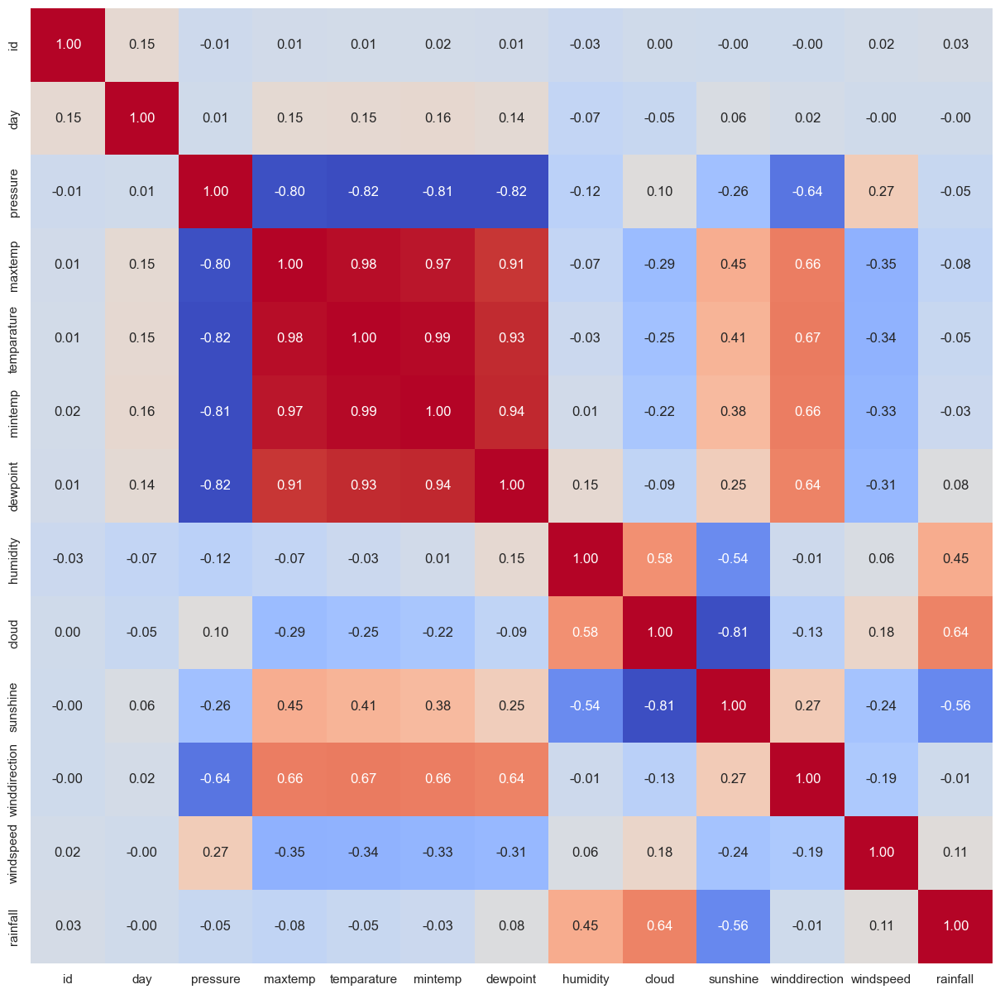

In [9]:
# Lets check correlation between the variables
correlation_data = train.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_data, annot = True, fmt=".2f", cbar = False, cmap = "coolwarm")
plt.show()

# There is high correlation between pressure, the temperature variables, and the dewpoint.
# There is also a negative correlation between sunshine and cloud.
# These relationships make inuitive sense.  Depending on the model we may need to remove some of these variables to avoid multicollinearity.

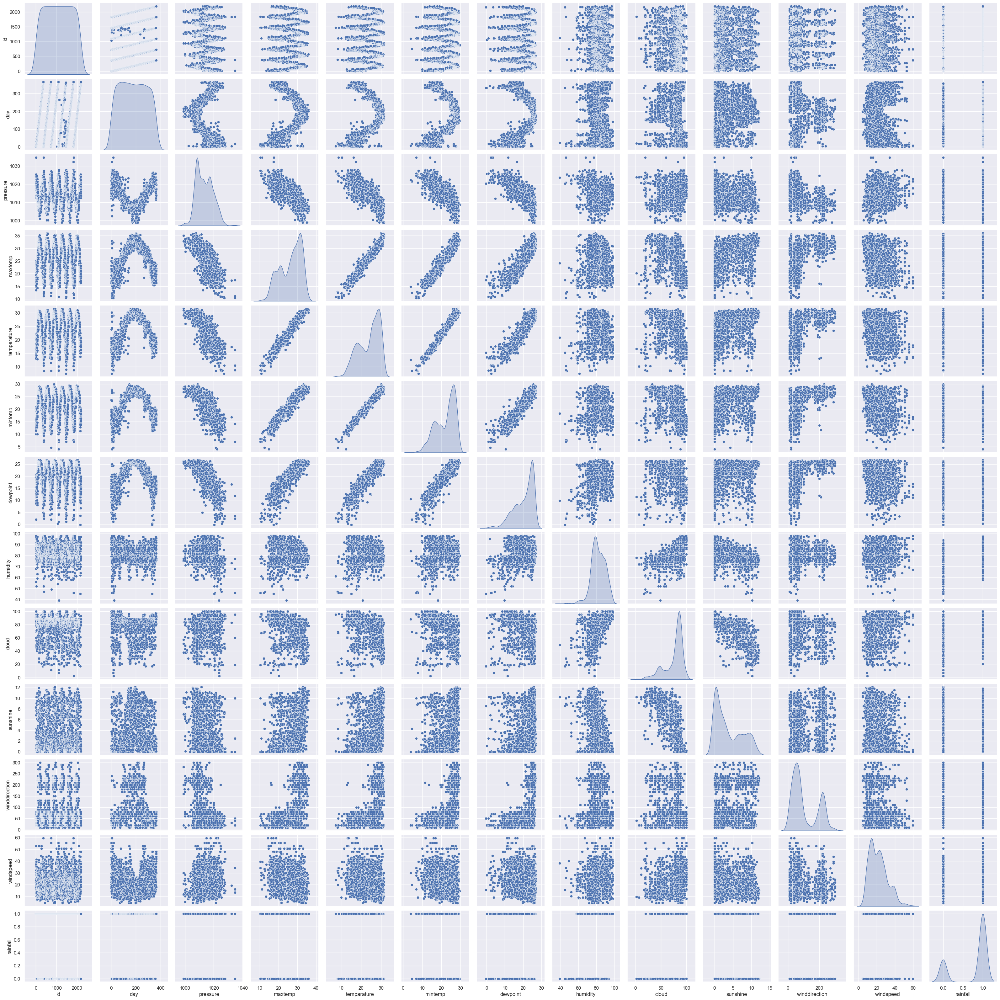

In [10]:
# Pairplot of the data
sns.pairplot(train, diag_kind="kde")
plt.show()

## EDA Results
Overall the data looks to be in pretty good shape. Here are some of the things I found

1. There is one missing value in the test data that needs to be corrected.  
2. You can see that some of the day data is corrupt in the training data, this needs to be corrected.
3. There is some correlation between factors, if I was to apply a regression model I would have to correct for this.
4. Wind direction appears to be in degrees, this is probably an issue for machine learning as 360 is maximally away from 0 but they are actually very similar.  I am going to try this approach, https://www.avanwyk.com/encoding-cyclical-features-for-deep-learning/.
5. Temperatue, pressure and dewpoint all have a seasonal relationship to days, not sure how I can handle that.
6. Days may run into a similar problem to wind directions 365(dec 31st) is very close to 1(jan 1st)
7. There is an imbalance between the response variable 1 has 1650 records and 0 has 540.


## Data Prep

In [81]:
# Fix the day values
train['day'] = (train.index % 365) + 1

# Fix missing values in test data
test = test.interpolate(axis=1)

# Make the days value the same type in train and test
test['day'] = test['day'].astype('int')

# A new feature could be created that is the difference between the maximum temperature and the minimum temperature for each day. This could be an indicator of how much the temperature fluctuates throughout the day.
train['temp_range'] = train['maxtemp'] - train['mintemp']
test['temp_range'] = test['maxtemp'] - test['mintemp']

# Calc difference between dewpoint and min temp
train['dewpoint_mintemp_diff'] = train['dewpoint'] - train['mintemp']
test['dewpoint_mintemp_diff'] = test['dewpoint'] - test['mintemp']

# Address wind direction as a circular feature
train['wind_direction_sin'] = np.sin(2 * np.pi * train['winddirection']/360.0)
train['wind_direction_cos'] = np.cos(2 * np.pi * train['winddirection']/360.0)

test['wind_direction_sin'] = np.sin(2 * np.pi * test['winddirection']/360.0)
test['wind_direction_cos'] = np.cos(2 * np.pi * test['winddirection']/360.0)

# Address days as a circular feature
train['day_sin'] = np.sin(2 * np.pi * train['day']/365.0)
train['day_cos'] = np.cos(2 * np.pi * train['day']/365.0)

test['day_sin'] = np.sin(2 * np.pi * test['day']/365.0)
test['day_cos'] = np.cos(2 * np.pi * test['day']/365.0)

# Previous days data could be useful. Decided against this as it could lead to data leakage for cross validation.
# train['yesterday_pressure'] = train['pressure'].shift(1)
# train['yesterday_maxtemp'] = train['maxtemp'].shift(1)
# train['yesterday_temparature'] = train['temparature'].shift(1)
# train['yesterday_mintemp'] = train['mintemp'].shift(1)
# train['yesterday_dewpoint'] = train['dewpoint'].shift(1)
# train['yesterday_humidity'] = train['humidity'].shift(1)
# train['yesterday_cloud'] = train['cloud'].shift(1)
# train['yesterday_sunshine'] = train['sunshine'].shift(1)
# train['yesterday_winddirection'] = train['winddirection'].shift(1)
# train['yesterday_windspeed'] = train['windspeed'].shift(1)
# train['yesterday_rainfall'] = train['rainfall'].shift(1)
# train['yesterday_temp_range'] = train['temp_range'].shift(1)

# train = train.dropna().reset_index(drop=True)


# Split the train data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(train.drop(columns = ['id','rainfall']), train['rainfall'], test_size=0.2, random_state=42)

# Create an X_submit variable that will be used to make the final predictions for submission
X_submit = test.drop(columns = ['id'])

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_submit_scaled = scaler.transform(X_submit)



## Modeling
Now that the data is prepared I'm going to try and apply two models to this data a SVM and a adaboost model.


### SVM
The plan with SVM is to apply a grid search to find the best hyper parameters.  As the kaggle competition is scored using AUC I'll use that as the scoring metric for the grid search.

As one can see below we achive the following scores on our test data. Accuracy: 0.8493, F1 Score: 0.9000, AUC: 0.7806.  This is decent but not great.  High F1 score means that we are handling the class imbalance well.

In [72]:
# Apply a grid search to find the best parameters for the model, using roc_auc as the scoring metric as that is the goal of the competition.
nlsvm = SVC()
parameters = {'C':np.logspace(-3, 3, num = 15, base=2), 'gamma': np.arange(0.5, 1.5, 0.1), 'kernel': ['linear','rbf', 'sigmoid']}
auc_scorer = make_scorer(roc_auc_score, greater_is_better=True)
grid = GridSearchCV(nlsvm, parameters, cv = 5, scoring = auc_scorer, n_jobs=-1).fit(X_train_scaled,y_train)
# grid = GridSearchCV(nlsvm, parameters, cv = 5, n_jobs=-1).fit(X_train_scaled,y_train)


<>:28: SyntaxWarning: invalid escape sequence '\S'
<>:28: SyntaxWarning: invalid escape sequence '\S'
C:\Users\ajkle\AppData\Local\Temp\ipykernel_24480\2044335986.py:28: SyntaxWarning: invalid escape sequence '\S'
  submission.to_csv('data\SVM_Submission_V3.csv', index=False)


{'C': np.float64(3.281341424030552), 'gamma': np.float64(0.5), 'kernel': 'linear'}
0.8002347574156806
cross-val AUC: 0.869
Accuracy: 0.8493, F1 Score: 0.9000, AUC: 0.7806


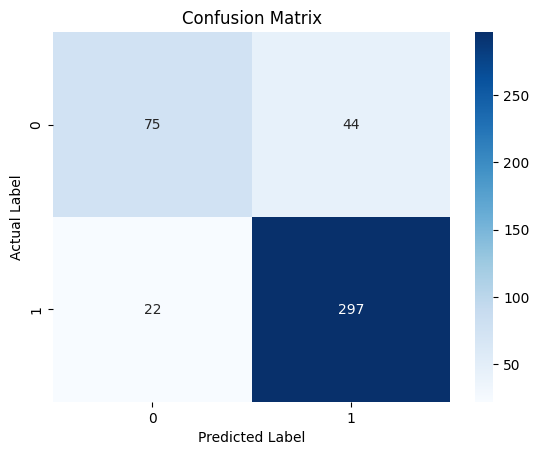

In [ ]:
# Check the best parameters and score
print(grid.best_params_)
print(grid.best_score_)

# Cross validation score
svm_best = grid.best_estimator_
scores = cross_val_score(svm_best, X_train_scaled,y_train)
print("cross-val AUC: {:.3f}".format(np.mean(scores)))

# test the model
test_pred = svm_best.predict(X_test_scaled)
accuracy = accuracy_score(y_test, test_pred)
f1 = f1_score(y_test, test_pred)
roc_auc = roc_auc_score(y_test, test_pred)
print(f"Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, AUC: {roc_auc:.4f}")

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, test_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

# Make the final predictions and save them to a csv file
sub_preds = svm_best.predict(X_submit_scaled) 
submission = pd.DataFrame({'id':test['id'],'rainfall':sub_preds})
submission.to_csv('data\SVM_Submission_V3.csv', index=False)

In [58]:
# Use this to submit the file to kaggle.
!kaggle competitions submit -c playground-series-s5e3 -f data\SVM_Submission_V3.csv -m "3rd SVM submission fixed"



Successfully submitted to Binary Prediction with a Rainfall Dataset



  0%|          | 0.00/7.14k [00:00<?, ?B/s]
100%|██████████| 7.14k/7.14k [00:00<00:00, 16.8kB/s]


## Adaboost
From a competition perspective, the SVM model is probably not the best as they wanted probabilities and the SVM model does not output probabilities.


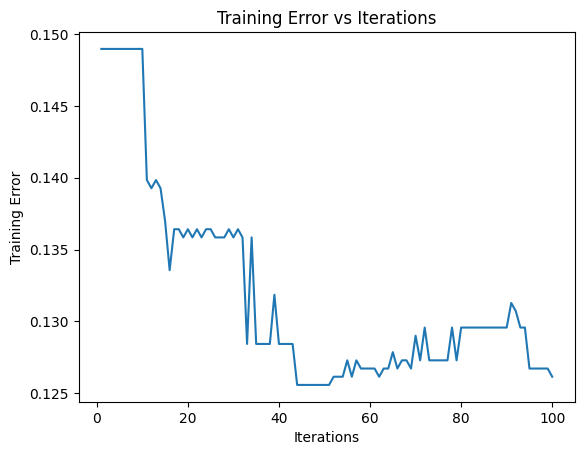

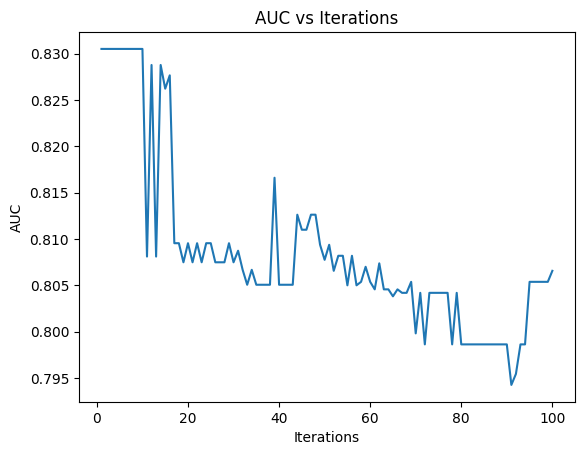

GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1)),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5, 1],
                         'n_estimators': range(30, 65)})

In [74]:
# Find a good range for boosting iterations
errors = []
aucs = []
for n in range(1, 101):
    ada_model = AdaBoostClassifier(
        DecisionTreeClassifier(max_depth=1),
        n_estimators=n,
        learning_rate=0.1,
        random_state=42
    )
    ada_model.fit(X_train_scaled, y_train)
    y_pred_train = ada_model.predict(X_train_scaled)
    error = np.mean(y_pred_train != y_train)
    errors.append(error)
    auc = roc_auc_score(y_train, y_pred_train)
    aucs.append(auc)

plt.plot(range(1, 101), errors)
plt.title('Training Error vs Iterations')
plt.xlabel('Iterations')
plt.ylabel('Training Error')
plt.show()

plt.plot(range(1, 101), aucs)
plt.title('AUC vs Iterations')
plt.xlabel('Iterations')
plt.ylabel('AUC')
plt.show()


# Define the parameter grid based on chart above
param_grid = {
    'n_estimators': range(30,65,1),
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5, 1]
}

# Set up the grid search
# Note I decided to not go with the AUC scoring as it appears to at a very small number of iterations.
ada_grid = GridSearchCV(
    estimator=AdaBoostClassifier(DecisionTreeClassifier(max_depth=1)),
    param_grid=param_grid,
    # scoring=auc_scorer, 
    cv=5,
    n_jobs=-1
)

# Fit the grid search
ada_grid.fit(X_train_scaled, y_train)


<>:28: SyntaxWarning: invalid escape sequence '\A'
<>:28: SyntaxWarning: invalid escape sequence '\A'
C:\Users\ajkle\AppData\Local\Temp\ipykernel_24480\2834873899.py:28: SyntaxWarning: invalid escape sequence '\A'
  submission.to_csv('data\ADA_Submission_V3.csv', index=False)


{'learning_rate': 0.3, 'n_estimators': 57}
0.8664387464387465
cross-val Score: 0.866
Accuracy: 0.8539, F1 Score: 0.9027, AUC: 0.7890


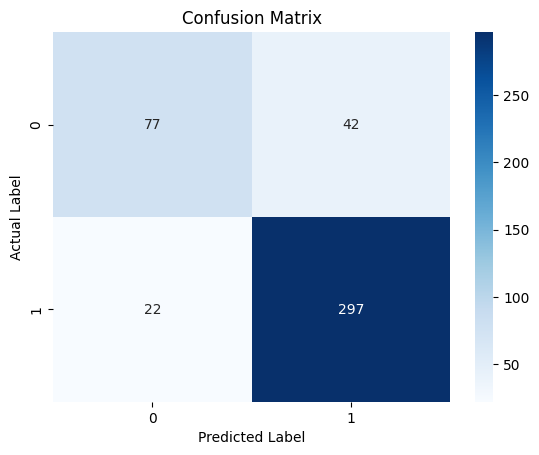

In [75]:
# Check the best parameters and score
print(ada_grid.best_params_)
print(ada_grid.best_score_)

# Cross validation score
ada_best = ada_grid.best_estimator_
scores = cross_val_score(ada_best, X_train_scaled,y_train)
print("cross-val Score: {:.3f}".format(np.mean(scores)))

# test the model
test_pred = ada_best.predict(X_test_scaled)
accuracy = accuracy_score(y_test, test_pred)
f1 = f1_score(y_test, test_pred)
roc_auc = roc_auc_score(y_test, test_pred)
print(f"Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, AUC: {roc_auc:.4f}")

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, test_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

# Make the final predictions and save them to a csv file
ada_test_probs = ada_best.predict_proba(X_submit_scaled)[:, 1] 
submission = pd.DataFrame({'id':test['id'],'rainfall':ada_test_probs})
submission.to_csv('data\ADA_Submission_V3.csv', index=False)

In [ ]:
!kaggle competitions submit -c playground-series-s5e3 -f data\ADA_Submission_V3.csv -m "3rd adaboost submission scaled data"

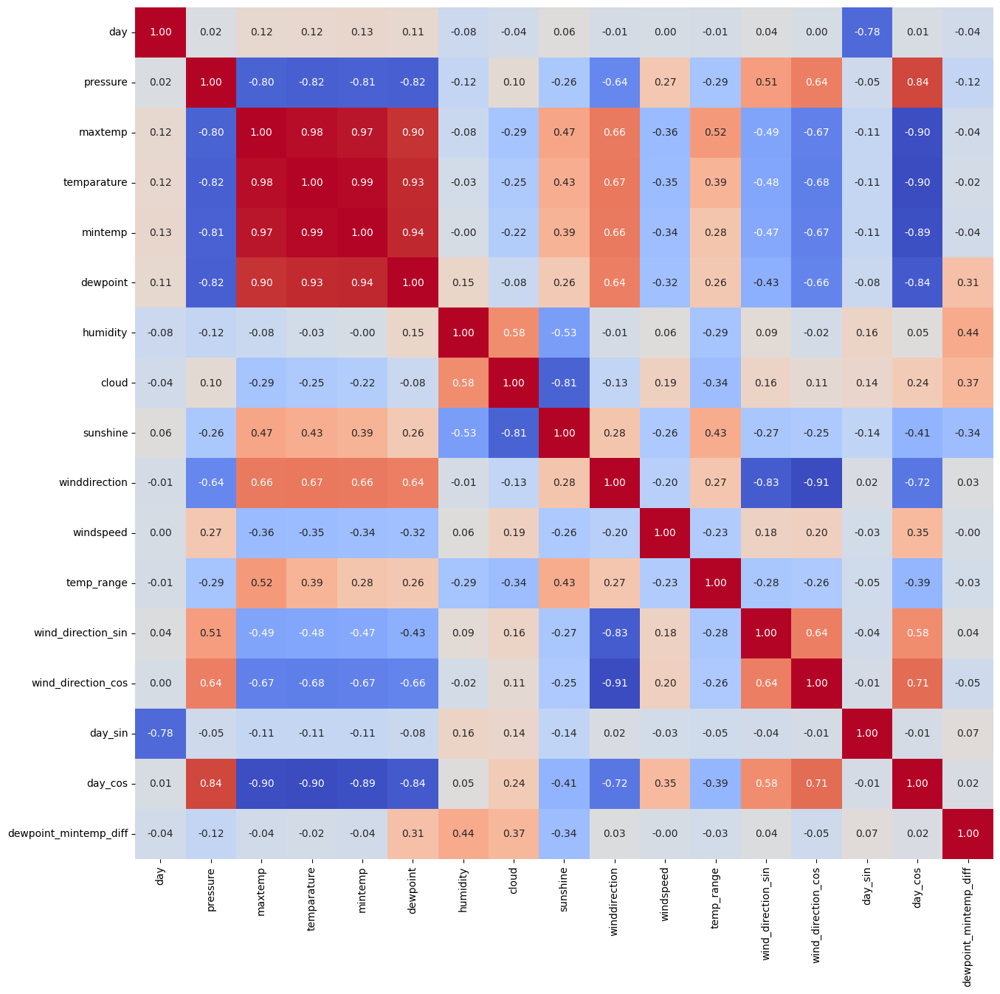

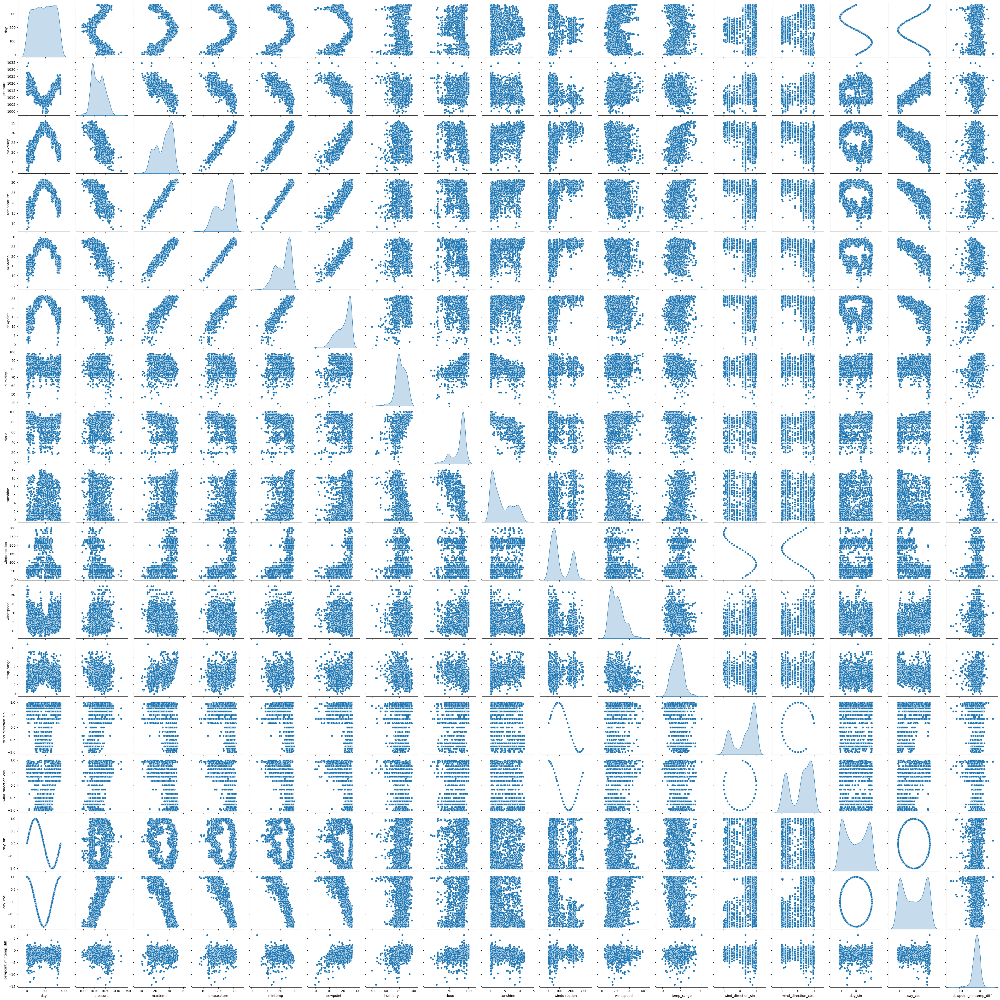

In [76]:
correlation_data = X_train.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_data, annot = True, fmt=".2f", cbar = False, cmap = "coolwarm")
plt.show()

# Pairplot of the data
sns.pairplot(X_train, diag_kind="kde")
plt.show()


{'learning_rate': 0.5, 'n_estimators': 94}
0.8527570207570208
cross-val Score: 0.853
Accuracy: 0.8174, F1 Score: 0.8795, AUC: 0.7350


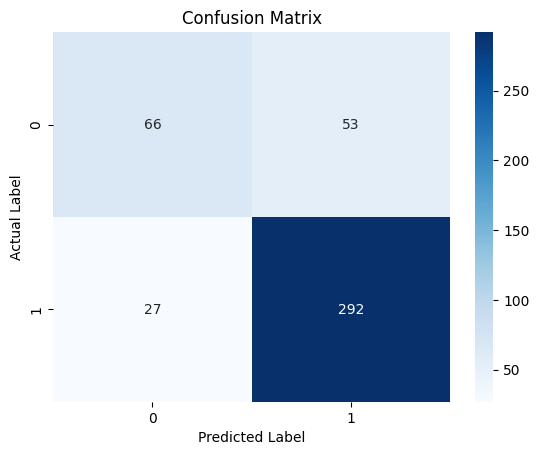

In [ ]:
# Trying Adaboost with less features
# Based on the correlation matrix, it appears that the following features are highly correlated with others and could be removed.
# day, maxtemp, mintemp, dewpoint, cloud, winddirection

X_train = X_train.drop(columns = ['day','maxtemp','mintemp','dewpoint','cloud','winddirection'])
X_test = X_test.drop(columns = ['day','maxtemp','mintemp','dewpoint','cloud','winddirection'])
X_submit = X_submit.drop(columns = ['day','maxtemp','mintemp','dewpoint','cloud','winddirection'])

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_submit_scaled = scaler.transform(X_submit)

# Run Adaboost again

# Define the parameter grid based on chart above
param_grid = {
    'n_estimators': range(30,100,1),
    'learning_rate': [0.01, 0.1, 0.2, 0.3, 0.5, 1, 2]
}

# Set up the grid search
# Note I decided to not go with the AUC scoring as it appears to at a very small number of iterations.
ada_grid = GridSearchCV(
    estimator=AdaBoostClassifier(DecisionTreeClassifier(max_depth=1)),
    param_grid=param_grid,
    # scoring=auc_scorer, 
    cv=5,
    n_jobs=-1
)

# Fit the grid search
ada_grid.fit(X_train_scaled, y_train)

# Check the best parameters and score
print(ada_grid.best_params_)
print(ada_grid.best_score_)

# Cross validation score
ada_best = ada_grid.best_estimator_
scores = cross_val_score(ada_best, X_train_scaled,y_train)
print("cross-val Score: {:.3f}".format(np.mean(scores)))

# test the model
test_pred = ada_best.predict(X_test_scaled)
accuracy = accuracy_score(y_test, test_pred)
f1 = f1_score(y_test, test_pred)
roc_auc = roc_auc_score(y_test, test_pred)
print(f"Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, AUC: {roc_auc:.4f}")

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, test_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()


## Model Comparison
The adaboost model with all the features was the best model with the following evaluation metrics
Accuracy: 0.8539, F1 Score: 0.9027, AUC: 0.7890

The SVM model came in second with the following metrics
Accuracy: 0.8493, F1 Score: 0.9000, AUC: 0.7806

Lastly the reduced adaboost model was the worst with the following metrics
Accuracy: 0.8174, F1 Score: 0.8795, AUC: 0.7350

This is no suprise as both SVM and adaboost theoretically can handle multicollinearity.